<a href="https://colab.research.google.com/github/hannahhillhouse/ECEN-303/blob/master/Copy_of_YOLOv5_Custom_Training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Custom Training with YOLOv5

In this tutorial, we assemble a dataset and train a custom YOLOv5 model to recognize the objects in our dataset. To do so we will take the following steps:

* Gather a dataset of images and label our dataset
* Export our dataset to YOLOv5
* Train YOLOv5 to recognize the objects in our dataset
* Evaluate our YOLOv5 model's performance
* Run test inference to view our model at work



![](https://uploads-ssl.webflow.com/5f6bc60e665f54545a1e52a5/615627e5824c9c6195abfda9_computer-vision-cycle.png)

# Step 1: Install Requirements

In [1]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 9899, done.
remote: Counting objects: 100% (86/86), done.
remote: Compressing objects: 100% (64/64), done.
remote: Total 9899 (delta 41), reused 46 (delta 22), pack-reused 9813
Receiving objects: 100% (9899/9899), 10.32 MiB | 10.49 MiB/s, done.
Resolving deltas: 100% (6832/6832), done.
/content/yolov5
     |████████████████████████████████| 596 kB 4.2 MB/s 
     |████████████████████████████████| 178 kB 5.1 MB/s 
     |████████████████████████████████| 1.1 MB 30.9 MB/s 
     |████████████████████████████████| 138 kB 52.8 MB/s 
     |████████████████████████████████| 62 kB 848 kB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incomp

# Step 2: Assemble Our Dataset

In order to train our custom model, we need to assemble a dataset of representative images with bounding box annotations around the objects that we want to detect. And we need our dataset to be in YOLOv5 format.

In Roboflow, you can choose between two paths:

* Convert an existing dataset to YOLOv5 format. Roboflow supports over [30 formats object detection formats](https://roboflow.com/formats) for conversion.
* Upload raw images and annotate them in Roboflow with [Roboflow Annotate](https://docs.roboflow.com/annotate).

# Annotate

![](https://github.com/roboflow-ai/yolov5/wiki/images/roboflow-annotate.gif)

# Version

![](https://github.com/roboflow-ai/yolov5/wiki/images/roboflow-preprocessing.png)

# Export

![](https://github.com/roboflow-ai/yolov5/wiki/images/roboflow-export.png)

# Download Code 

![](https://github.com/roboflow-ai/yolov5/wiki/images/roboflow-snippet.png)

In [2]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [3]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="yNMmv2WPecOEXTvmmMb1")
project = rf.workspace().project("seniordesign")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to SeniorDesign-1 in yolov5pytorch:: 100%|██████████| 724/724 [00:00<00:00, 922.23it/s]


In [4]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [5]:
#after following the link above, recieve python code with these fields filled in
#from roboflow import Roboflow
#rf = Roboflow(api_key="YOUR API KEY HERE")
#project = rf.workspace().project("YOUR PROJECT")
#dataset = project.version("YOUR VERSION").download("yolov5")

# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [6]:
!python train.py --img 416 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/yolov5/SeniorDesign-1/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-54-gac2c49a torch 1.9.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, tra

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [7]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [8]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/yolov5/SeniorDesign-1/test/images, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-54-gac2c49a torch 1.9.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/36 /content/yolov5/SeniorDesign-1/test/images/20210909_125548---Copy_jpg.rf.e11543e486de249cb82ad894a3431aad.jpg: 416x416 1 I, Done. (0.026s)
image 2/36 /content/yolov5/SeniorDesign-1/test/images/20210909_125631_jpg.rf.faaef388a627f3e8154649325e945b59.jpg: 416x416 1 I, Done. (0.026s)
image 3/36 /content/yolov5/SeniorDesign-1/test/images/20210909_125635_jpg.rf.0fd8370

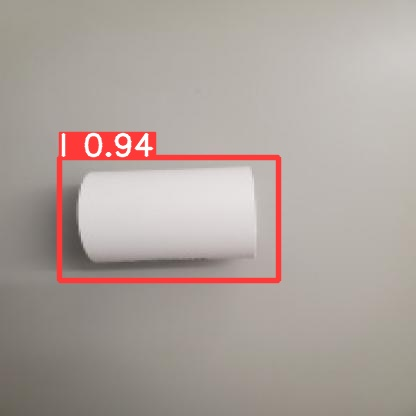

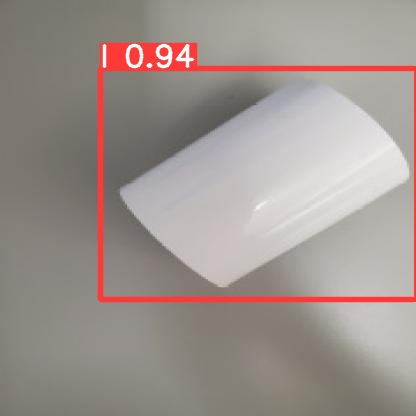

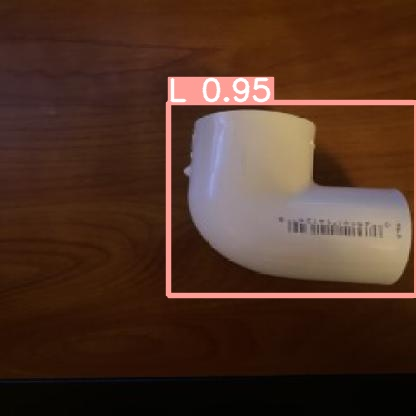

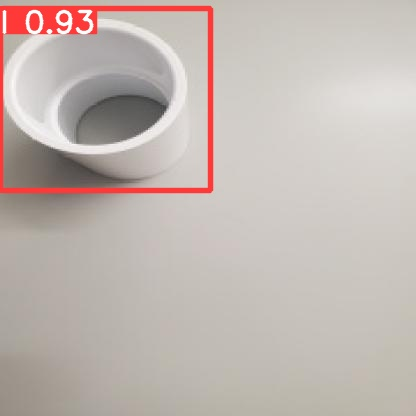

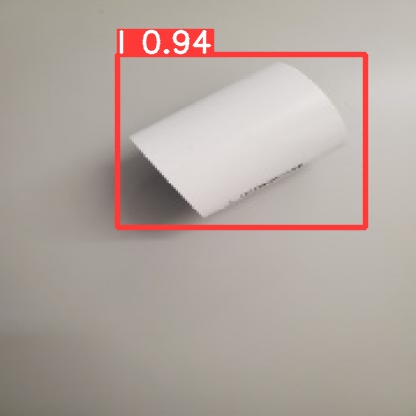

...

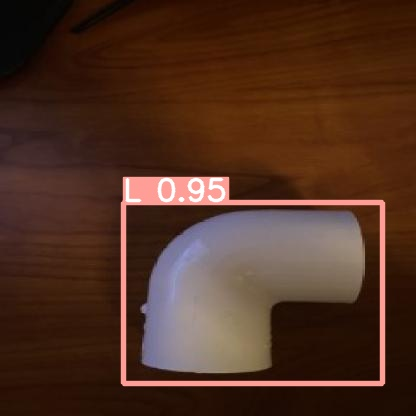

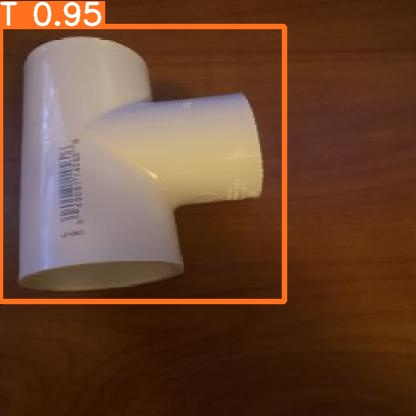

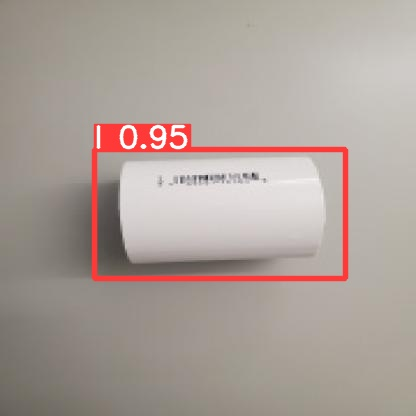

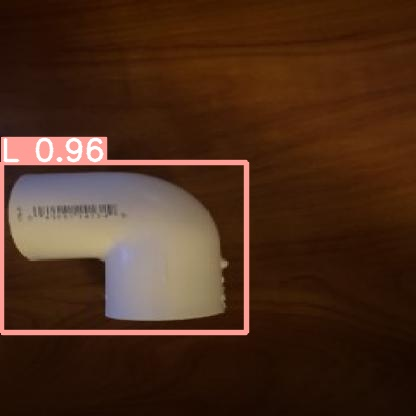

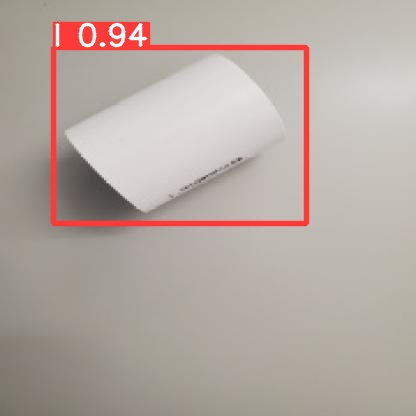

In [9]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Conclusion and Next Steps

Congratulations! You've trained a custom YOLOv5 model to recognize your custom objects.

To improve you model's performance, we recommend first interating on your datasets coverage and quality. See this guide for [model performance improvement](https://github.com/ultralytics/yolov5/wiki/Tips-for-Best-Training-Results).

To deploy your model to an application, see this guide on [exporting your model to deployment destinations](https://github.com/ultralytics/yolov5/issues/251).

Once your model is in production, you will want to continually iterate and improve on your dataset and model via [active learning](https://blog.roboflow.com/what-is-active-learning/).

In [10]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Prediction

# Use the captured photo to make predictions
%matplotlib inline

import os
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from PIL import Image as PImage
import tensorflow as tf
import re
from google.protobuf import text_format
import torchvision.utils
#from utils import label_map_util



In [ ]:
# Load the labels
category_index = label_map_util.create_category_index_from_labelmap(LABEL_MAP_PATH, use_display_name=True)
# Load the model
path_to_frozen_graph = os.path.join("/content/output", '/content/output/frozen_inference_graph.pb')
detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(path_to_frozen_graph, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

NameError: ignored

In [ ]:
def prediction(image_path,plot=True): 
  with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
      # these are all basically tensorflow variables
      # Definite input and output Tensors for detection_graph
      image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
      # Each box represents a part of the image where a particular object was detected.
      detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
      # Each score represent how level of confidence for each of the objects.
      # Score is shown on the result image, together with the class label.
      detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
      detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
      num_detections = detection_graph.get_tensor_by_name('num_detections:0')
      # loading image using PImage library
      image = PImage.open(image_path)
      # the array based representation of the image will be used later in order to prepare the
      # result image with boxes and labels on it.
      (im_width, im_height) = image.size
      image_np = np.array(image.getdata()).reshape((im_height, im_width, 3)).astype(np.uint8)
      # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
      image_np_expanded = np.expand_dims(image_np, axis=0)
      # Actual detection of the image that we pass through the function.
      (boxes, scores, classes, num) = sess.run(
          [detection_boxes, detection_scores, detection_classes, num_detections],
          feed_dict={image_tensor: image_np_expanded})
      # Visualization of the results of a detection.
     
      vis_util.visualize_boxes_and_labels_on_image_array(
          image_np,
          np.squeeze(boxes),
          np.squeeze(classes).astype(np.int32),
          np.squeeze(scores),
          category_index,
          use_normalized_coordinates=True,
          line_thickness=8)
  
  return (boxes, scores, classes, num,image_np)

In [ ]:
def error_detection(image_path,true_count,dataf,a):

  thresh = 0.60
  coordinates = []
  #count = {"nut":0,"screw":0,"bracket":0,"other":0} # creating a temporary count where we will store our detected objects
  count = {"I":0,"L":0,"T":0,"other":0}
  (boxes, scores, classes, num,image_np) = prediction(image_path)   #prediction function is updating the count
  
  # looping through the detected objects 
  for i in range(len(scores[0])):
    # only consider it if score is greater than 60%
    if scores[0][i]>=thresh:
      current = boxes[0][i]
      coordinates.append(current)
      # then we will increase the count of that obj in our local count variable
      name = category_index[classes[0][i]]["name"] 
      count[name] = count[name]+1
  
  count1=count.copy()
  dataf.append(count1)    
  print(count)
  

  # c=0 is basically a variable. We will only increase its value if the true count is equal to count for any of the four objects
  # For example: if nut is not the same then c will stay 0, if the value of screw is the same then c will be 1
  #              if bracket is not same then c will stay at 1 and if same then c will be 2 
  c=0
  cc=a
  dd=0
  for obj in count.keys():
    if count[obj] != true_count[obj]:
      diff = true_count[obj]-count[obj]
      if diff>=0:
        print("Error! {} {} is/are missing".format(diff,obj))
        dataf.append("Error! {} {} is/are missing".format(diff,obj))
        count[obj] = count[obj]+diff
             
      else:
        print("Error! {} {} is/are excess".format(diff*-1,obj))
        dataf.append("Error! {} {} is/are excess".format(diff*-1,obj))
        count[obj] = count[obj] - (diff*-1)
      
    else:
      # count=true_count for all the categories
      c=c+1


  coordinates = []
  #count = {"nut":0,"screw":0,"bracket":0,"other":0}
  count = {"I":0,"L":0,"T":0,"other":0}

  (boxes, scores, classes, num,image_np) = prediction(image_path)
  for i in range(len(scores[0])):
    if scores[0][i]>=thresh:
      current = boxes[0][i]
      coordinates.append(current)
      name = category_index[classes[0][i]]["name"] 
      count[name] = count[name]+1
  for obj in count.keys():
    
    if count[obj] != true_count[obj]:
      
      diff = true_count[obj]-count[obj]
      if obj=="other" and diff!=0:
        print("Remove the other/unknown object and then move to the staging area")
        dataf.append("Remove the other/unknown object")
        break
      if diff>0:
        #print("Error! {} {} are missing".format(diff,obj))
        #count[obj] = count[obj]+diff
        print(" {} {} added to the CURRENT BIN from the PARTS BIN ".format(diff,obj))
        dataf.append(" {} {} added to the CURRENT BIN from the PARTS BIN ".format(diff,obj))
      else: 
        #print("Error! {} {} are excess".format(diff*-1,obj))
        #count[obj] = count[obj] - (diff*-1)
        print(" {} {} removed from the CURRENT BIN to the PARTS BIN".format(diff*-1,obj))
        dataf.append(" {} {} removed from the CURRENT BIN to the PARTS BIN".format(diff*-1,obj))
  
  if c==len(count):
    # Here basically we are checking if the length of the count is 4 and if it is 4 then it means that the
    # true count and count is same for all the 4 parts. In that case we can move to the staging area
    print("Entire order is here, move to the staging area")
    dataf.append("Entire order is here, move to the staging area")
    # cc=a=0, so now cc=0+1=1. Then it will perform image processing again in the next cell
    cc=cc+1

  return (count,image_np,cc,dd) # ignore dd but basically we are returning these values from the error detection function

In [ ]:
class order:
  def __init__(self, I,L,T,other):
    self.I = I
    self.L = L
    self.T = T
    self.other = other

def pred_images(im_path,t_count,dataf):
  
  # Checking if its a directory or a single image 
  error = pd.DataFrame(columns = list(t_count.keys()))
  if os.path.isdir(im_path):
  # We go to the else part basically if its a single image. 
  # For both scenarios, it asks the user for the input and then goes to the error detection function 
  # Dataf.append is basically a data frame that will later be converted into a txt form
    images = os.listdir(im_path)
    img_names = []
    for img in images:
      
      try:
        a=0
        b=0
        if img.endswith("jpg"):
          
          img_path = im_path+"/"+img
          print('Name:{}'.format(img))
          dataf.append('Name:{}'.format(img))
          dataf.append("I_shaped_PVC needed: {}".format(t_count["I"]))
          dataf.append("L_shaped_PVC needed: {}".format(t_count["L"]))
          dataf.append("T_shaped_PVC needed: {}".format(t_count["T"]))
          dataf.append("Other needed: {}".format(t_count["other"]))
          count,image_np,c1,d1 = error_detection(img_path,t_count,dataf,a)
          if c1==1: # C1 is a flag to re check if this is 1 then we have the 4th scenario 
            print("Performing image processing again")
            del dataf[-1]
            del dataf[-1]
            del dataf[-1]
            del dataf[-1]
            del dataf[-1]
            del dataf[-1]
            dataf.append(("Performed image processing again"))
            dataf.append("I_shaped_PVC needed: {}".format(t_count["I"]))
            dataf.append("L_shaped_PVC needed: {}".format(t_count["L"]))
            dataf.append("T_shaped_PVC needed: {}".format(t_count["T"]))
            dataf.append("Other needed: {}".format(t_count["other"]))       # calling error detection function again for rechecking
            count,image_np,c2,d1 = error_detection(im_path,t_count,dataf,a) # a is initially 0 but if true count and count are the same then a becomes 1 and #d1 is just variable for any further changes
          dataf.append("-------------------------------------------------------------")
      except :
        continue
    error["Image"] = img_names
    #error.to_csv("/content/output/error.txt",index=False)
  else :
    a=0  # this is for the 4th scenario
    b=0  # we don't need b
    print('Name:{}'.format(im_path))
    dataf.append("Name: {}".format(im_path))
    dataf.append("I_shaped_PVC needed: {}".format(t_count["I"]))
    dataf.append("L_shaped_PVC needed: {}".format(t_count["L"]))
    dataf.append("T_shaped_PVC needed: {}".format(t_count["T"]))
    dataf.append("Other needed: {}".format(t_count["other"]))
    count2,image_np,c1,d1 = error_detection(im_path,t_count,dataf,a)
    if c1==1:
            print("\n")
            print("Performing image processing again")
            print("\n")
            del dataf[-1] #deleting wrong values ie values before double check so that we only get the latest values on the txt file
            del dataf[-1]
            del dataf[-1]
            del dataf[-1]
            del dataf[-1]
            del dataf[-1]
            dataf.append(("Performed image processing again"))
            dataf.append("I_shaped_PVC needed: {}".format(t_count["I"]))
            dataf.append("L_shaped_PVC needed: {}".format(t_count["L"]))
            dataf.append("T_shaped_PVC needed: {}".format(t_count["T"]))
            dataf.append("Other needed: {}".format(t_count["other"]))
            count,image_np,c3,d1 = error_detection(im_path,t_count,dataf,a) # rechecking, basically performing image processing again
            
    dataf.append("-------------------------------------------------------------")
    plt.figure(figsize=(12, 8))
    plt.imshow(image_np)
  return dataf

In [ ]:
# Storing the old scenarios in dq so everything prints out in the txt file one after another
dq=[]

In [ ]:
orderNumber1 = order(2, 4, 6, 0)
orderNumber2 = order(3, 5, 8, 0)
orderNumber3 = order(7, 9, 12, 0)

#true_count = {'I":orderNumber1.I,"L":orderNumber1.L,"T":orderNumber1.T,"other":orderNumber1.other}
#true_count = {"I":orderNumber2.I,"L":orderNumber2.L,"T":orderNumber2.T,"other":orderNumber2.other}
true_count = {"I":orderNumber3.I,"L":orderNumber3.L,"T":orderNumber3.T,"other":orderNumber3.other}

dataf=dq

img_path = "/content/Tensorflow/images/4g.jpg"        # giving the input path for the image; can either be a single image or a directory

pred_images(img_path,true_count,dataf)
# Put the data in the df and then output the df in a txt file. Basically we have everything stored in dataf
df = pd.DataFrame(dataf)
# Here dq has the old data and dataf has the new data
dq=dataf
df.to_csv("/content/output/error.txt",index=False) 

Name:/content/Tensorflow/images/4g.jpg


NameError: ignored

In [ ]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

In [ ]:
from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))